In [1]:
library("Matrix")
library(Seurat)
library(DT)
library(dplyr)
library(here)
library(ggplot2)
library(mclust)
library(cowplot)
library(tidyverse)
library(reshape)
library(SingleR)
library(annotate)
library("org.Mm.eg.db")
library(biomaRt)
library(scCustomize)
library(future)
library(ggnewscale)
library(furrr)
library(readxl)
library(STACAS)

rank_score_func <- function(df){

df <- df %>% mutate(score = -1*log(p_val_adj+(10^-310))*avg_logFC*(pct.1/(pct.2+10^-300)))

return(df)
}

convertHumanGeneList <- function(x){

require("biomaRt")
human = useMart("ensembl", dataset = "hsapiens_gene_ensembl")
mouse = useMart("ensembl", dataset = "mmusculus_gene_ensembl")

genesV2 = getLDS(attributes = c("hgnc_symbol"), filters = "hgnc_symbol", values = x , mart = human, attributesL = c("mgi_symbol"), martL = mouse, uniqueRows=T)

humanx <- unique(genesV2[, 2])

# Print the first 6 genes found to the screen
print(head(humanx))
return(humanx)
}

library("remotes")
library("fs")

ggtheme <- function() {
  theme(
    axis.text = element_text(size = 20),
    axis.title = element_text(size = 20),
    text = element_text(size = 20, colour = "black"),
    legend.text = element_text(size = 20),
    legend.key.size =  unit(10, units = "points")
    
  )
}

mid.se <- celldex::MonacoImmuneData();

The legacy packages maptools, rgdal, and rgeos, underpinning the sp package,
which was just loaded, will retire in October 2023.
Please refer to R-spatial evolution reports for details, especially
https://r-spatial.org/r/2023/05/15/evolution4.html.
It may be desirable to make the sf package available;
package maintainers should consider adding sf to Suggests:.
The sp package is now running under evolution status 2
     (status 2 uses the sf package in place of rgdal)

Attaching SeuratObject


Attaching package: 'DT'


The following object is masked from 'package:SeuratObject':

    JS


The following object is masked from 'package:Seurat':

    JS



Attaching package: 'dplyr'


The following objects are masked from 'package:stats':

    filter, lag


The following objects are masked from 'package:base':

    intersect, setdiff, setequal, union


here() starts at /auto/brno2/home/vercanie/DIA

Package 'mclust' version 5.4.8
Type 'citation("mclust")' for citing this R package in publica

# All diabetes data - new and old

## CD8 new

In [2]:
paths  <- list.files("data/rawdata/", full.names = T)

In [3]:
paths

[1] "data/rawdata//exp08_init_with_Mixcr.rds"      
 [2] "data/rawdata//exp10_init_with_Mixcr.rds"      
 [3] "data/rawdata//exp11_W1_init_with_Mixcr.rds"   
 [4] "data/rawdata//exp11_W2_init_with_Mixcr.rds"   
 [5] "data/rawdata//exp16_CD4_A_init_with_Mixcr.rds"
 [6] "data/rawdata//exp16_CD4_B_init_with_Mixcr.rds"
 [7] "data/rawdata//exp16_CD8_A_init_with_Mixcr.rds"
 [8] "data/rawdata//exp16_CD8_B_init_with_Mixcr.rds"
 [9] "data/rawdata//exp18_1_init_with_Mixcr.rds"    
[10] "data/rawdata//exp18_2_init_with_Mixcr.rds"    
[11] "data/rawdata//exp18_3_init_with_Mixcr.rds"    
[12] "data/rawdata//exp18_4_init_with_Mixcr.rds"    
[13] "data/rawdata//exp19_1_init_with_Mixcr.rds"    
[14] "data/rawdata//exp19_2_init_with_Mixcr.rds"    
[15] "data/rawdata//exp19_3_init_with_Mixcr.rds"    
[16] "data/rawdata//exp19_4_init_with_Mixcr.rds"    
[17] "data/rawdata//exp20_1_init_with_Mixcr.rds"    
[18] "data/rawdata//exp20_2_init_with_Mixcr.rds"    
[19] "data/rawdata//exp20_3_init_with_Mixcr.rds"    
[20] "data/rawdata//exp20_4_init_with_Mixcr.rds"

In [4]:
seu_list  <- map(paths[c(1,2,3,7,8,9,11,13,15,17,19)], readRDS)

In [5]:
seu_list[[2]]$hashtags  %>% table

.
 H1 H10  H2  H3  H4  H5  H6  H7  H8  H9 
743 831 821 762 825 695 821 761 787 802 

In [6]:
exp10_cd8  <- subset(seu_list[[2]], hashtags == "H5")

In [7]:
seu_list[[2]] <- exp10_cd8

In [8]:
new_dia_cd8  <- scCustomize::Merge_Seurat_List(seu_list)

Warning message in CheckDuplicateCellNames(object.list = objects):
"Some cell names are duplicated across objects provided. Renaming to enforce unique cell names."
Warning message in CheckDuplicateCellNames(object.list = objects):
"Some cell names are duplicated across objects provided. Renaming to enforce unique cell names."
Warning message in CheckDuplicateCellNames(object.list = objects):
"Some cell names are duplicated across objects provided. Renaming to enforce unique cell names."
Warning message in CheckDuplicateCellNames(object.list = objects):
"Some cell names are duplicated across objects provided. Renaming to enforce unique cell names."
Warning message in CheckDuplicateCellNames(object.list = objects):
"Some cell names are duplicated across objects provided. Renaming to enforce unique cell names."


In [9]:
new_dia_cd8

An object of class Seurat 
15166 features across 111682 samples within 3 assays 
Active assay: RNA (15152 features, 0 variable features)
 2 other assays present: Antibodies, PTPRC

In [10]:
options(future.globals.maxSize = 10000 * 1024^2)
plan("sequential")

In [11]:
DefaultAssay(new_dia_cd8)  <- "RNA"
new_dia_cd8 <- NormalizeData(new_dia_cd8, verbose = FALSE)
new_dia_cd8 <- ScaleData(new_dia_cd8, verbose = FALSE)
new_dia_cd8 <- FindVariableFeatures(new_dia_cd8, nfeatures = 1000, verbose = FALSE)
new_dia_cd8 <- RunPCA(new_dia_cd8, npcs = 12, verbose = FALSE)
new_dia_cd8 <- RunUMAP(new_dia_cd8, reduction = "pca", dims = 1:12)

Warning message:
"The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session"
13:08:59 UMAP embedding parameters a = 0.9922 b = 1.112

13:08:59 Read 111682 rows and found 12 numeric columns

13:08:59 Using Annoy for neighbor search, n_neighbors = 30

13:08:59 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

13:09:09 Writing NN index file to temp file /var/tmp/pbs.18192037.meta-pbs.metacentrum.cz/RtmpBdDSiZ/fileb47305a92c406

13:09:09 Searching Annoy index using 1 thread, search_k = 3000

13:09:59 Annoy recall = 100%

13:10:00 Commencing smooth kNN distance calibrati

In [12]:
new_dia_cd8 <- FindNeighbors(new_dia_cd8, dims = 1:12)
new_dia_cd8 <- FindClusters(new_dia_cd8, resolution = 1)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 111682
Number of edges: 2924253

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8596
Number of communities: 21
Elapsed time: 48 seconds


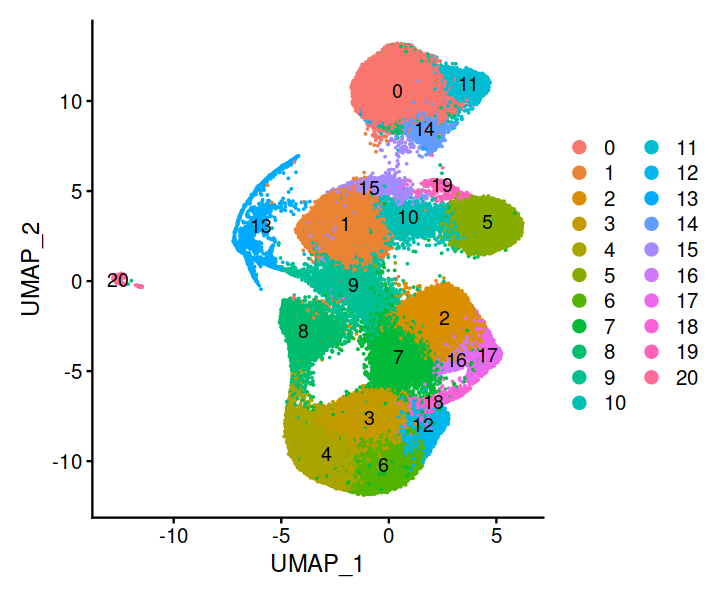

In [13]:
options(repr.plot.width = 6, repr.plot.height = 5)

DimPlot(new_dia_cd8, label = T, raster = F)

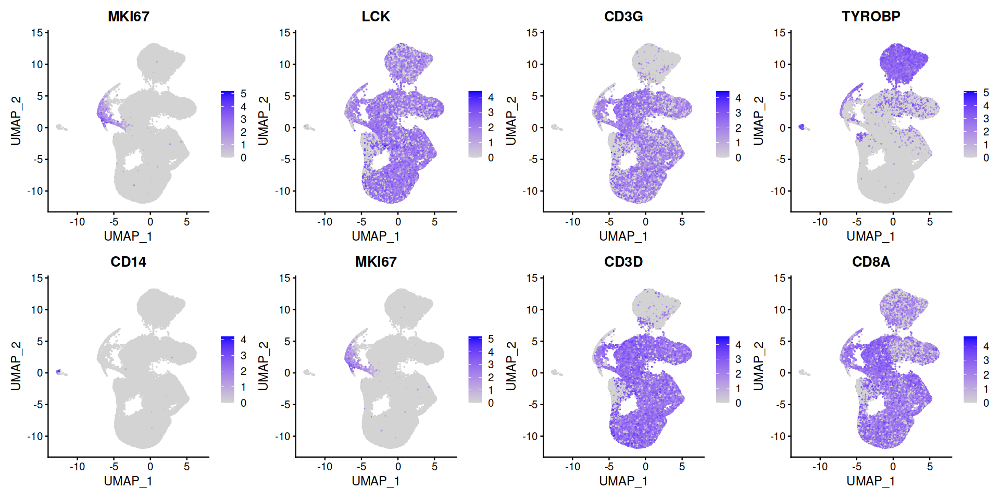

In [14]:
options(repr.plot.width = 16, repr.plot.height = 8)
FeaturePlot(new_dia_cd8, features = c("MKI67", "LCK", "CD3G", "TYROBP", "CD14", "MKI67", "CD3D", "CD8A"), ncol = 4, raster = F)

### Automated annotation of cell types

In [15]:
library(Azimuth)
mid.se <- celldex::MonacoImmuneData()
hpca.se  <- celldex::HumanPrimaryCellAtlasData()
load("data/ref_wherry_new.RData")

Registered S3 method overwritten by 'SeuratDisk':
  method            from  
  as.sparse.H5Group Seurat

Attaching shinyBS

snapshotDate(): 2020-10-27

see ?celldex and browseVignettes('celldex') for documentation

loading from cache

see ?celldex and browseVignettes('celldex') for documentation

loading from cache

snapshotDate(): 2020-10-27

see ?celldex and browseVignettes('celldex') for documentation

downloading 1 resources

retrieving 1 resource

loading from cache

see ?celldex and browseVignettes('celldex') for documentation

downloading 1 resources

retrieving 1 resource

loading from cache



In [16]:
annotate_tcell_data  <- function(seurat_dataset){
    
    ## This function annotates a Seurat object with three annotations:
    ## 1. Monaco Immune dataset annotations
    ## 2. Annotations based on bulk RNAseq from Giles et al, 2022
    ## 3. Azimuth annotations
        
    DefaultAssay(seurat_dataset)  <- "RNA"
	
    ### Annotate the dataset with Monaco Immune dataset
		pred.singler <- SingleR(test = seurat_dataset@assays$RNA@counts, ref = mid.se, assay.type.test=1,
		labels = mid.se$label.fine, fine.tune = F)
    
	### Annotate the dataset with Wherry dataset
        pred.singler2 <- SingleR(test = seurat_dataset@assays$RNA@counts, ref = ref_wherry_new$matrix,
		labels = ref_wherry_new$labels, fine.tune = F)

    	### Annotate the dataset with Wherry dataset
        pred.singler3 <- SingleR(test = seurat_dataset@assays$RNA@counts, ref = hpca.se,
		assay.type.test=1,
		labels = hpca.se$label.fine, fine.tune = F)

		all_labels <- data.frame(
		Monaco_single = pred.singler$labels,
		HPCA_single = pred.singler3$labels,
		Wherry_main = pred.singler2$labels,
		barcode = colnames(seurat_dataset))
		
		md2 <- seurat_dataset@meta.data
		md2$barcode = colnames(seurat_dataset)

		md3 <- left_join(md2, all_labels)

		seurat_dataset@meta.data <- md3
		rownames(seurat_dataset@meta.data) <- colnames(seurat_dataset)
		
	### Annotate the dataset with Azimuth
		
		seurat_dataset <- RunAzimuth(seurat_dataset, reference = "pbmcref")
		return(seurat_dataset)
	}


new_dia_cd8  <- annotate_tcell_data(new_dia_cd8)

Joining with `by = join_by(barcode)`


An AzimuthData object - reference version: 1.0.0 
Contains 3 meta.data field(s) to transfer.

Warning message:
"Overwriting miscellanous data for model"
detected inputs from HUMAN with id type Gene.name

reference rownames detected HUMAN with id type Gene.name

Using reference SCTModel to calculate pearson residuals

Determine variable features

Setting min_variance to:  -Inf

Calculating residuals of type pearson for 3901 genes



  |======================================================================| 100%


Set default assay to refAssay

Normalizing query using reference SCT model

Projecting cell embeddings

Finding query neighbors

Finding neighborhoods

Finding anchors

	Found 9078 anchors

Finding integration vectors

Finding integration vector weights

Predicting cell labels

Warning message:
"Keys should be one or more alphanumeric characters followed by an underscore, setting key from predictionscorecelltype.l1_ to predictionscorecelltypel1_"
Predicting cell labels

Warning message:
"Feature names cannot have underscores ('_'), replacing with dashes ('-')"
Warning message:
"Keys should be one or more alphanumeric characters followed by an underscore, setting key from predictionscorecelltype.l2_ to predictionscorecelltypel2_"
Predicting cell labels

Warning message:
"Feature names cannot have underscores ('_'), replacing with dashes ('-')"
Warning message:
"Keys should be one or more alphanumeric characters followed by an underscore, setting key from predictionscorecelltype.l3_ to p

In [17]:
saveRDS(new_dia_cd8, "data/processed/cd8_full.rds")

In [2]:
new_dia_cd8  <- readRDS("data/processed/cd8_full.rds")

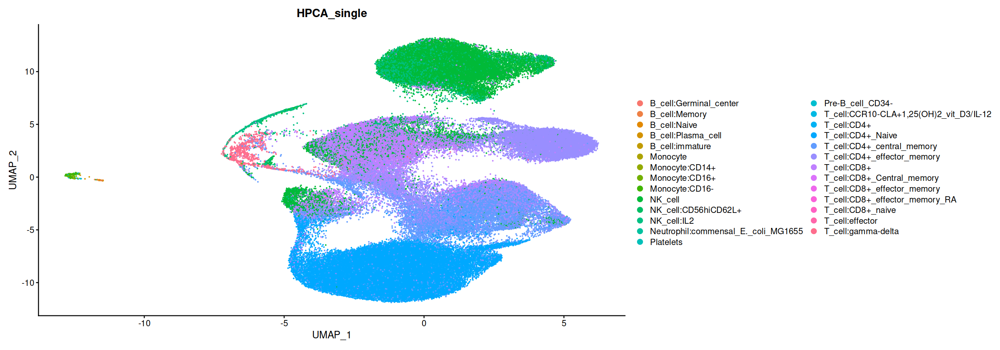

In [22]:
options(repr.plot.width = 20, repr.plot.height = 7)

DimPlot(new_dia_cd8, raster = F, group.by = "HPCA_single", label = F)

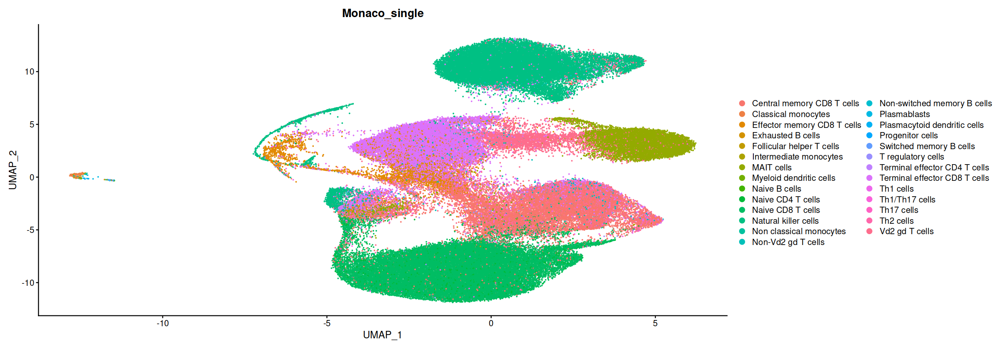

In [19]:
DimPlot(new_dia_cd8, raster = F, group.by = "Monaco_single", label = F)

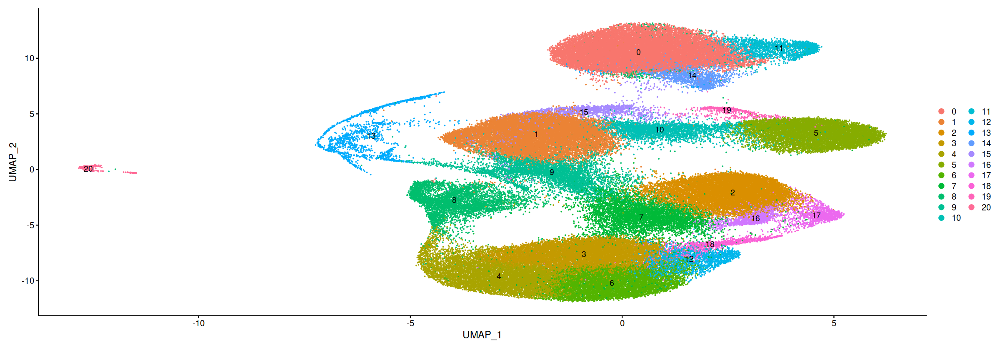

In [20]:
DimPlot(new_dia_cd8, label = T, raster = F)

In [26]:
DefaultAssay(new_dia_cd8)  <- "RNA"

In [27]:
new_dia_cd8 <- FindNeighbors(new_dia_cd8, dims = 1:12)
new_dia_cd8 <- FindClusters(new_dia_cd8, resolution = 0.8)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 111682
Number of edges: 2924253

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8763
Number of communities: 21
Elapsed time: 52 seconds


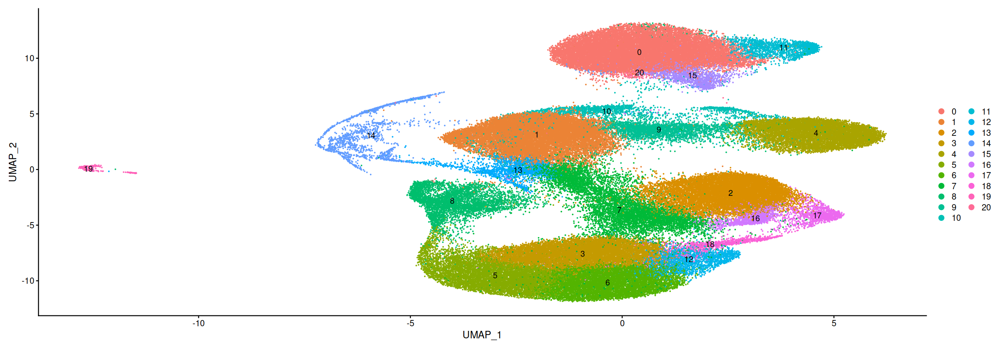

In [28]:
DimPlot(new_dia_cd8, label = T, raster = F)

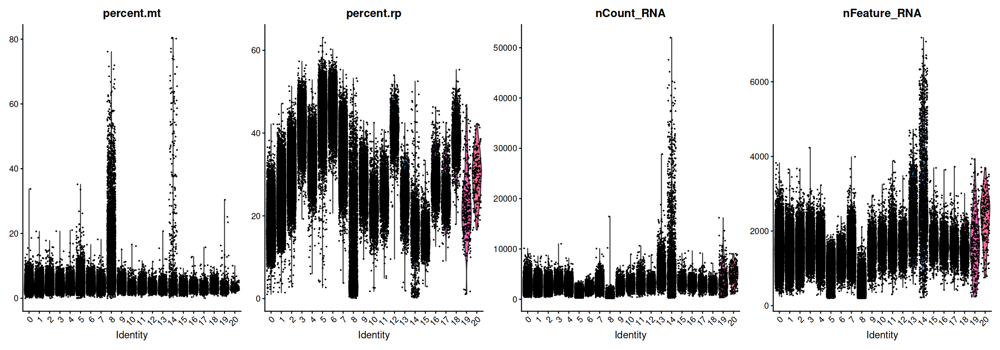

In [29]:
VlnPlot(new_dia_cd8, features = c("percent.mt", "percent.rp", "nCount_RNA", "nFeature_RNA"), ncol = 4, raster = F)

### Remove dead and contaminating cells

In [30]:
cutoff_nFeature_RNA <- 500
cutoff_percent_mt <- 10
cluster_exclude  <- c(8,19)

Warning message in geom_hline(yintercept = cutoff_percent_mt, geom = "line", width = 0.5, :
"Ignoring unknown parameters: `geom` and `width`"
Warning message in geom_hline(yintercept = cutoff_nFeature_RNA, geom = "line", width = 0.5, :
"Ignoring unknown parameters: `geom` and `width`"


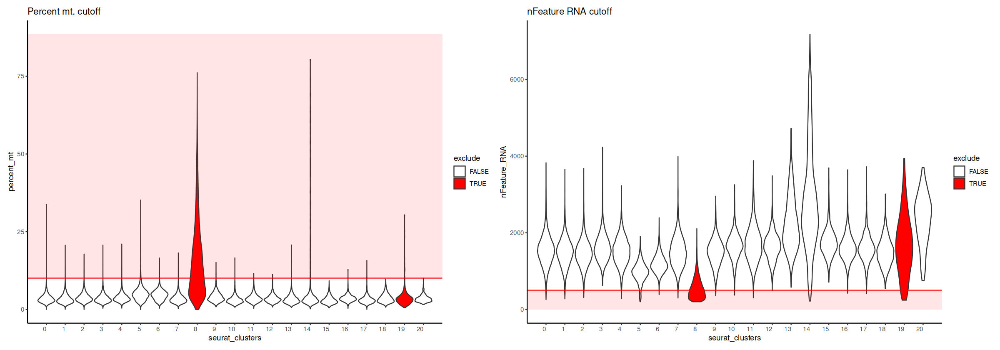

In [31]:
p1 <- ggplot(data.frame(nCount_RNA = new_dia_cd8$nCount_RNA,
                  nFeature_RNA = new_dia_cd8$nFeature_RNA,
                  percent_mt = new_dia_cd8$percent.mt,
                  seurat_clusters = new_dia_cd8$seurat_clusters,
                  exclude = ifelse(new_dia_cd8$seurat_clusters %in% cluster_exclude, TRUE, FALSE)), 
       aes(x = seurat_clusters, y = percent_mt)) +
  geom_violin(scale = "width", aes(fill = exclude)) + 
  geom_hline(yintercept = cutoff_percent_mt,
               geom = "line", 
               width = 0.5,
               colour = "red") + 
  ggtitle("Percent mt. cutoff") + 
  theme_classic() +
  scale_fill_manual(values = c("white","red")) +
  theme(panel.background = element_blank(), 
        axis.text.x = element_text(angle = 0, hjust = 1)) +
  annotate(geom = "rect", xmin = min(as.numeric(new_dia_cd8$seurat_clusters))-1, 
           xmax = max(as.numeric(new_dia_cd8$seurat_clusters))+1, 
           ymin=cutoff_percent_mt,ymax=1.1*(max(new_dia_cd8$percent.mt)), fill = "red", alpha = 0.1)

p2 <- ggplot(data.frame(nCount_RNA = new_dia_cd8$nCount_RNA,
                  nFeature_RNA = new_dia_cd8$nFeature_RNA,
                  percent_mt = new_dia_cd8$percent.mt,
                  seurat_clusters = new_dia_cd8$seurat_clusters,
                        exclude = ifelse(new_dia_cd8$seurat_clusters %in% cluster_exclude, TRUE, FALSE)), 
       aes(x = seurat_clusters, y = nFeature_RNA)) +
  geom_violin(scale = "width", aes(fill = exclude)) + 
  geom_hline(yintercept = cutoff_nFeature_RNA,
               geom = "line", 
               width = 0.5,
               colour = "red") + 
  ggtitle("nFeature RNA cutoff") + 
  theme_classic() +
  scale_fill_manual(values = c("white","red")) +
  theme(panel.background = element_blank(), 
        axis.text.x = element_text(angle = 0, hjust = 1)) +
  annotate(geom = "rect", xmin = min(as.numeric(new_dia_cd8$seurat_clusters))-1, 
           xmax = max(as.numeric(new_dia_cd8$seurat_clusters))+1, 
           ymin=0, ymax=cutoff_nFeature_RNA, fill = "red", alpha = 0.1)



p1 + p2

In [32]:
new_dia_cd8  <- subset(new_dia_cd8, 
                      percent.mt < cutoff_percent_mt &
                      nFeature_RNA > cutoff_nFeature_RNA & 
                       seurat_clusters %in% c(0:7,9:18,20))

Warning message:
"Keys should be one or more alphanumeric characters followed by an underscore, setting key from ref.umap_ to refumap_"


In [33]:
new_dia_cd8 <- NormalizeData(new_dia_cd8, verbose = FALSE)
new_dia_cd8 <- ScaleData(new_dia_cd8, verbose = FALSE)
new_dia_cd8 <- FindVariableFeatures(new_dia_cd8, nfeatures = 800, verbose = FALSE)
new_dia_cd8 <- RunPCA(new_dia_cd8, npcs = 12, verbose = FALSE)
new_dia_cd8 <- RunUMAP(new_dia_cd8, reduction = "pca", dims = 1:12)
new_dia_cd8 <- FindNeighbors(new_dia_cd8, dims = 1:12)
new_dia_cd8 <- FindClusters(new_dia_cd8, resolution = 1)

14:15:42 UMAP embedding parameters a = 0.9922 b = 1.112

14:15:42 Read 105644 rows and found 12 numeric columns

14:15:42 Using Annoy for neighbor search, n_neighbors = 30

14:15:42 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

14:15:51 Writing NN index file to temp file /var/tmp/pbs.18192037.meta-pbs.metacentrum.cz/RtmpBdDSiZ/fileb473043bb4fce

14:15:51 Searching Annoy index using 1 thread, search_k = 3000

14:16:32 Annoy recall = 100%

14:16:34 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors = 30

14:16:37 Initializing from normalized Laplacian + noise (using irlba)

14:16:39 Commencing optimization for 200 epochs, with 4456000 positive edges

14:17:15 Optimization finished

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 105644
Number of edges: 2712504

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8512
Number of communities: 23
Elapsed time: 40 seconds


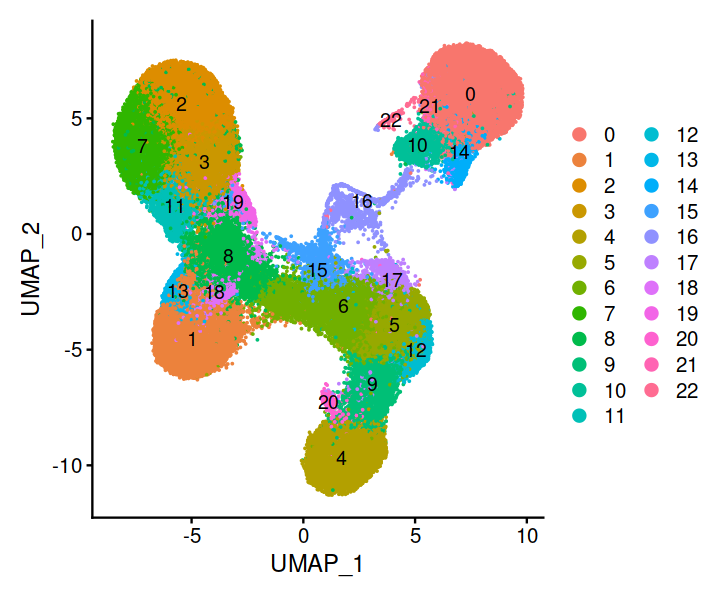

In [34]:
options(repr.plot.width = 6, repr.plot.height = 5)
DimPlot(new_dia_cd8, label = T, raster = F)

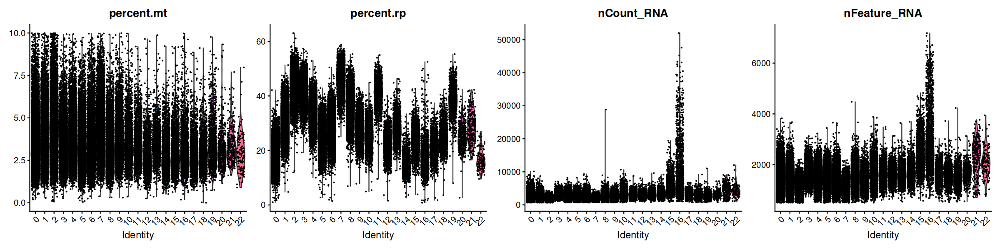

In [35]:
options(repr.plot.width = 20)
VlnPlot(new_dia_cd8, features = c("percent.mt", "percent.rp", "nCount_RNA", "nFeature_RNA"), ncol = 4, raster = F)

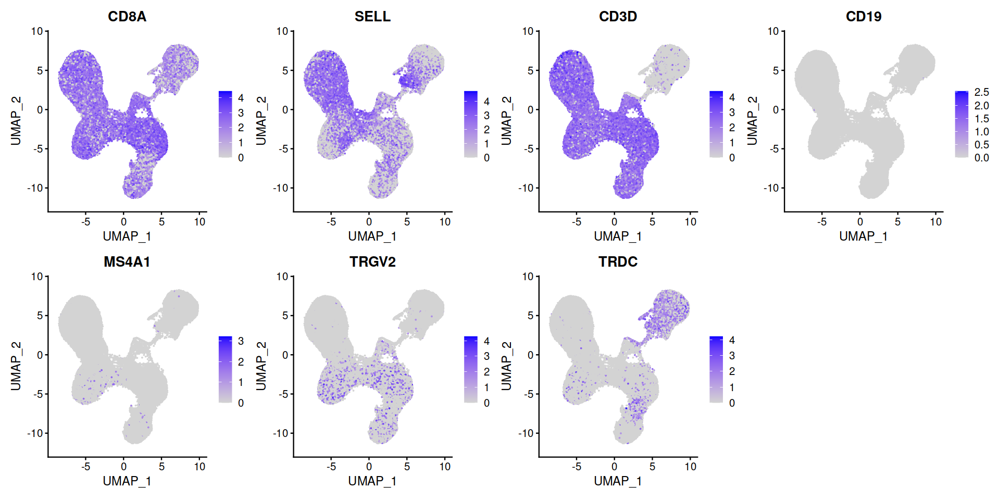

In [36]:
options(repr.plot.width = 16, repr.plot.height = 8)

FeaturePlot(new_dia_cd8, features = c("CD8A", "SELL", "CD3D", "CD19", "MS4A1", "TRGV2", "TRDC"), ncol = 4, raster = F)

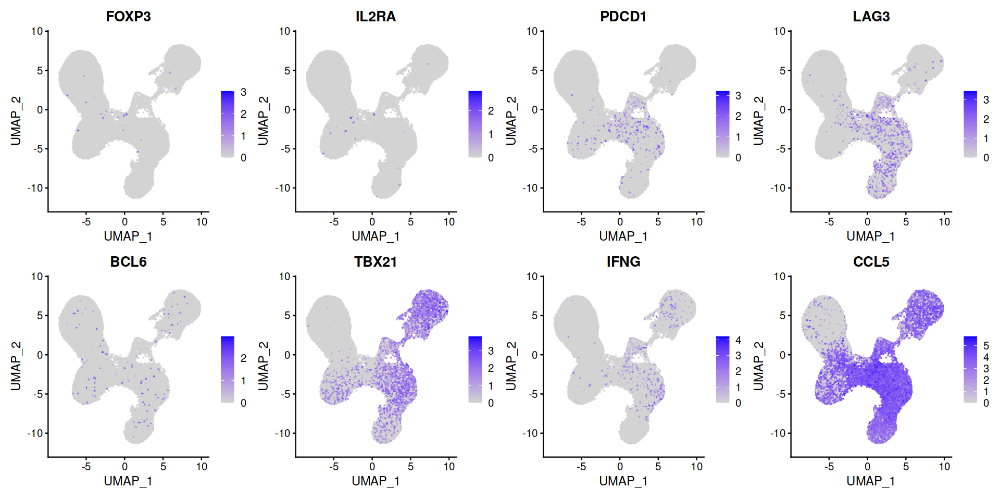

In [37]:
options(repr.plot.width = 16, repr.plot.height = 8)

FeaturePlot(new_dia_cd8, features = c("FOXP3", "IL2RA", "PDCD1", "LAG3", "BCL6", "TBX21", "IFNG", "CCL5"), ncol = 4, raster = F)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 105644
Number of edges: 2712504

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8888
Number of communities: 15
Elapsed time: 36 seconds


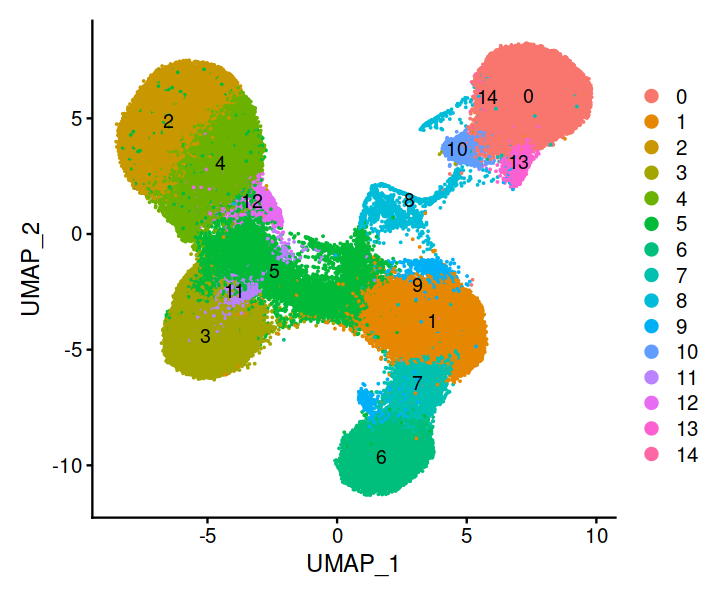

In [38]:
new_dia_cd8 <- FindClusters(new_dia_cd8, resolution = 0.6)

options(repr.plot.width = 6, repr.plot.height = 5)
DimPlot(new_dia_cd8, label = T, raster = F)

### PCA on samples

In [39]:
new_dia_cd8@meta.data  %>% colnames

[1] "orig.ident"                  "nCount_RNA"                 
 [3] "nFeature_RNA"                "percent.mt"                 
 [5] "percent.rp"                  "nCount_Antibodies"          
 [7] "nFeature_Antibodies"         "hashtags"                   
 [9] "Experiment_ID"               "Date_prepared"              
[11] "Prepared_by"                 "Sample_ID"                  
[13] "Well"                        "Hashtag"                    
[15] "Hashtag_sequence"            "Hashtag_cat_n"              
[17] "Hashtag_dilution"            "Project.code"               
[19] "Well_CT_ID"                  "Condition"                  
[21] "Species"                     "Age"                        
[23] "Age_group"                   "Sex"                        
[25] "Library_code"                "Patient_ID"                 
[27] "is_cell"                     "chain"                      
[29] "contig_id"                   "high_confidence"            
[31] "productive"                  "length"                     
[33] "reads"                       "umis"                       
[35] "vdj_source"                  "count_TRA"                  
[37] "count_TRB"                   "count_Multi"                
[39] "cdr3_A1"                     "cdr3_A1_nt"                 
[41] "cdr3_A2"                     "cdr3_A2_nt"                 
[43] "cdr3_B"                      "cdr3_B_nt"                  
[45] "cdr3_Multi"                  "cdr3_Multi_nt"              
[47] "v_gene_A1"                   "j_gene_A1"                  
[49] "v_gene_A2"                   "j_gene_A2"                  
[51] "v_gene_B"                    "d_gene_B"                   
[53] "j_gene_B"                    "v_gene_Multi"               
[55] "d_gene_Multi"                "j_gene_Multi"               
[57] "clonotypes"                  "has.VDJ"                    
[59] "has.complete.VDJ"            "nCount_PTPRC"               
[61] "nFeature_PTPRC"              "RNA_snn_res.0.5"            
[63] "seurat_clusters"             "clonotype.repeated"         
[65] "RNA_snn_res.0.8"             "RNA_snn_res.1"              
[67] "barcode"                     "Monaco_single"              
[69] "HPCA_single"                 "Wherry_main"                
[71] "nCount_refAssay"             "nFeature_refAssay"          
[73] "predicted.celltype.l1.score" "predicted.celltype.l1"      
[75] "predicted.celltype.l2.score" "predicted.celltype.l2"      
[77] "predicted.celltype.l3.score" "predicted.celltype.l3"      
[79] "mapping.score"               "RNA_snn_res.0.6"

In [40]:
new_dia_cd8$Condition  %>% table

.
   Ctrl T0    Ctrl T1     Dia T0     Dia T1 Pre-Dia T0 
     20183       4461      45721      31646       3633 

In [41]:
new_dia_cd8@meta.data  <- new_dia_cd8@meta.data  %>% separate(Condition, into = c("Disease", "Time"), remove = F, sep = " ")

In [42]:
new_dia_cd8$Sample_char  <- paste(new_dia_cd8$Patient_ID, 
                                  new_dia_cd8$Disease,
                                  new_dia_cd8$Time,
                                  new_dia_cd8$Age_group,
                                  new_dia_cd8$Sex,
                                  new_dia_cd8$Experiment_ID)

In [43]:
cd8_samples  <- AverageExpression(new_dia_cd8, group.by = "Sample_char", return.seurat = T)

Warning message:
"Keys should be one or more alphanumeric characters followed by an underscore, setting key from prediction.score.celltype.l1_ to predictionscorecelltypel1_"
Warning message:
"Keys should be one or more alphanumeric characters followed by an underscore, setting key from prediction.score.celltype.l2_ to predictionscorecelltypel2_"
Warning message:
"Keys should be one or more alphanumeric characters followed by an underscore, setting key from prediction.score.celltype.l3_ to predictionscorecelltypel3_"
Centering and scaling data matrix



In [44]:
cd8_samples  <- FindVariableFeatures(cd8_samples)

In [45]:
cd8_samples  <- RunPCA(cd8_samples)

Warning message in irlba(A = t(x = object), nv = npcs, ...):
"You're computing too large a percentage of total singular values, use a standard svd instead."
PC_ 1 
Positive:  ABHD17A, TGFB1, CAPNS1, PIP4K2A, AKT1, PREX1, KIAA2013, CD81, GNB1, GNAI2 
	   TRAPPC10, MAPK1, MAP2K2, ARL8A, FMNL1, EFHD2, STK39, ZNRF2, UTRN, PTP4A2 
	   TAF10, ARHGAP26, CCDC92, GSK3A, IQGAP1, CLPTM1L, QKI, RUNX3, BTBD6, IQGAP2 
Negative:  RGS10, EIF3E, BTF3, NPM1, ST13, LSM5, ALKBH7, EIF3H, ANP32B, UQCRB 
	   PCBP2, EEF1A1, OCIAD2, C1QBP, SARAF, FKBP1A, PEBP1, LDLRAP1, IMPDH2, CCNI 
	   APEX1, LRRN3, PLEKHB1, IFNGR2, ATP6V0E2, NDFIP1, EIF2D, CLNS1A, PRKAR1B, TIMM9 
PC_ 2 
Positive:  SNRPD3, AC010422.8, CSNK2B, RNASEK, KLRK1, AC091959.1, DYNLRB1, STXBP2, NAA10, UBE2V1 
	   AC005833.1, IL2RG, MATR3.1, SARNP, AC129492.3, PTPRCAP, RAB5C, TRAPPC5, DHPS, AL358472.6 
	   ANKHD1, SLC35A1, AL365205.1, NOL12, ARL6IP1, CHMP4A, FKBP2, EEF1E1, VPS33A, PPAN-P2RY11 
Negative:  AMMECR1L, WASH6P, MTRNR2L12, R3HDM2, USF2, AC00

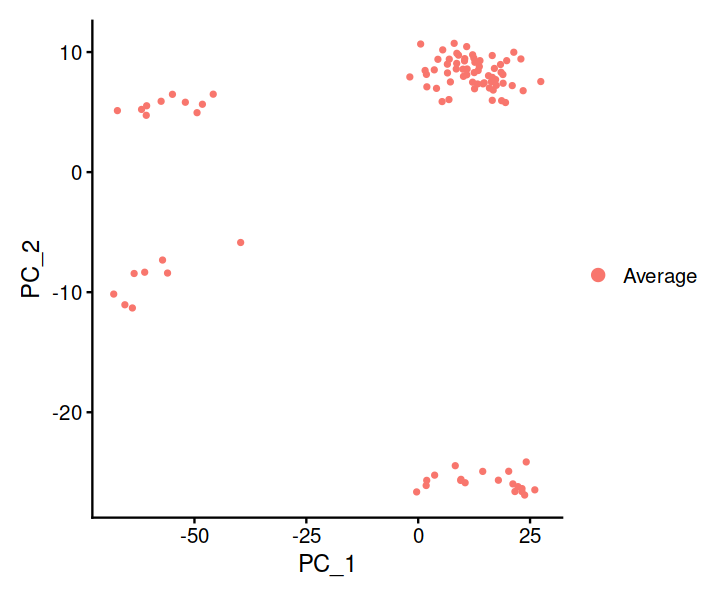

In [46]:
DimPlot(cd8_samples)

In [47]:
cd8_samples$Sample_char  <- colnames(cd8_samples)

In [48]:
cd8_samples$Sample_char  %>% table

.
    101 Dia T0 1 M Exp18     101 Dia T1 1 M Exp18     102 Dia T0 1 M Exp18 
                       1                        1                        1 
    102 Dia T1 1 M Exp18     103 Dia T0 2 M Exp18     103 Dia T1 2 M Exp18 
                       1                        1                        1 
    104 Dia T0 3 M Exp08     104 Dia T0 3 M Exp18     104 Dia T1 3 M Exp18 
                       1                        1                        1 
    105 Dia T0 1 M Exp08     105 Dia T0 1 M Exp18     105 Dia T1 1 M Exp18 
                       1                        1                        1 
    106 Dia T0 1 F Exp08     106 Dia T0 1 F Exp18     106 Dia T1 1 F Exp18 
                       1                        1                        1 
    107 Dia T0 1 M Exp11     107 Dia T0 1 M Exp18     107 Dia T1 1 M Exp18 
                       1                        1                        1 
    108 Dia T0 2 F Exp08     108 Dia T0 2 F Exp18     108 Dia T1 2 F Exp18 
          

In [49]:
cd8_samples@meta.data  <- cd8_samples@meta.data  %>% separate(Sample_char, 
                                                              into = c("Patient_ID",
                                                                      "Disease",
                                                                      "Time",
                                                                      "Age_group",
                                                                      "Sex",
                                                                      "Exp"), 
                                                             sep = " ",
                                                             remove = F)

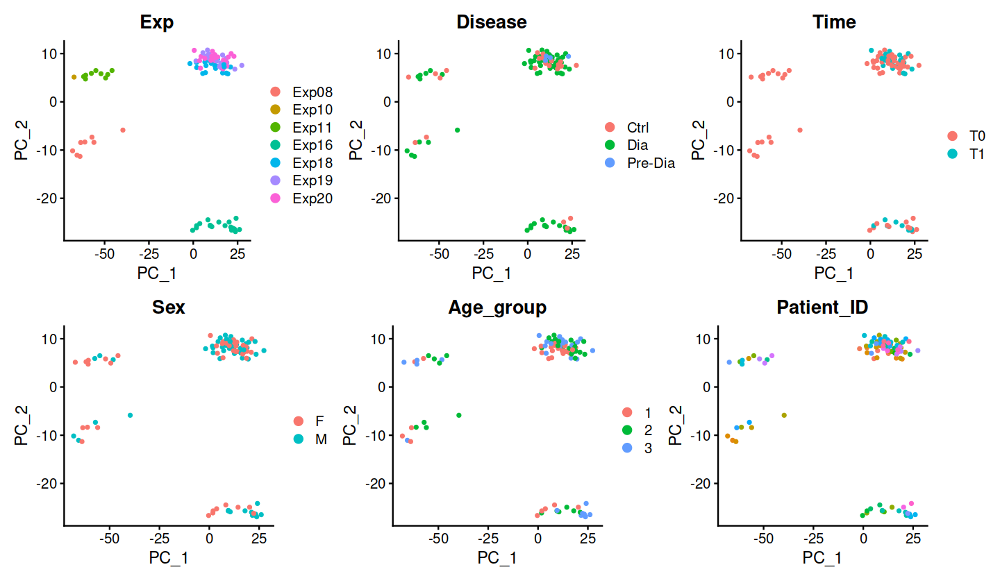

In [50]:
options(repr.plot.width = 12, repr.plot.height = 7)
(DimPlot(cd8_samples, group.by = "Exp") + DimPlot(cd8_samples, group.by = "Disease") + DimPlot(cd8_samples, group.by = "Time")) / (DimPlot(cd8_samples, group.by = "Sex") + DimPlot(cd8_samples, group.by = "Age_group") + (DimPlot(cd8_samples, group.by = "Patient_ID") + NoLegend()))

## STACAS Integration over Experiment

In [51]:
new_dia_experiment  <- SplitObject(new_dia_cd8, split.by = "Experiment_ID")

In [52]:
new_dia_experiment

$Exp08
An object of class Seurat 
30413 features across 7048 samples within 7 assays 
Active assay: RNA (15152 features, 800 variable features)
 6 other assays present: Antibodies, PTPRC, refAssay, prediction.score.celltype.l1, prediction.score.celltype.l2, prediction.score.celltype.l3
 4 dimensional reductions calculated: pca, umap, integrated_dr, ref.umap

$Exp10
An object of class Seurat 
30413 features across 650 samples within 7 assays 
Active assay: RNA (15152 features, 800 variable features)
 6 other assays present: Antibodies, PTPRC, refAssay, prediction.score.celltype.l1, prediction.score.celltype.l2, prediction.score.celltype.l3
 4 dimensional reductions calculated: pca, umap, integrated_dr, ref.umap

$Exp11
An object of class Seurat 
30413 features across 9625 samples within 7 assays 
Active assay: RNA (15152 features, 800 variable features)
 6 other assays present: Antibodies, PTPRC, refAssay, prediction.score.celltype.l1, prediction.score.celltype.l2, prediction.score.cell

In [53]:
# normalize and identify variable features for each dataset independently
merged.list <- lapply(X = new_dia_experiment, FUN = function(x) {
    DefaultAssay(x)  <- "RNA"
    x$barcode  <- colnames(x)
    x <- NormalizeData(x)
    x <- FindVariableFeatures(x, selection.method = "vst", nfeatures = 800)
})

library(STACAS)

new_dia_experiment <- Run.STACAS(merged.list, dims = 1:12)
new_dia_experiment <- RunUMAP(new_dia_experiment, dims = 1:12) 

Warning message in asMethod(object):
"sparse->dense coercion: allocating vector of size 1.1 GiB"
Warning message in asMethod(object):
"sparse->dense coercion: allocating vector of size 2.0 GiB"
Warning message in asMethod(object):
"sparse->dense coercion: allocating vector of size 1.7 GiB"
Warning message in asMethod(object):
"sparse->dense coercion: allocating vector of size 1.6 GiB"
Preparing PCA embeddings for objects...

Building integration tree with base dataset: 6

Merging dataset 4 into 6

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 7 into 6 4

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 5 into 6 4 7

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 1 into 3

Extracting anchors for merged samples

Finding 

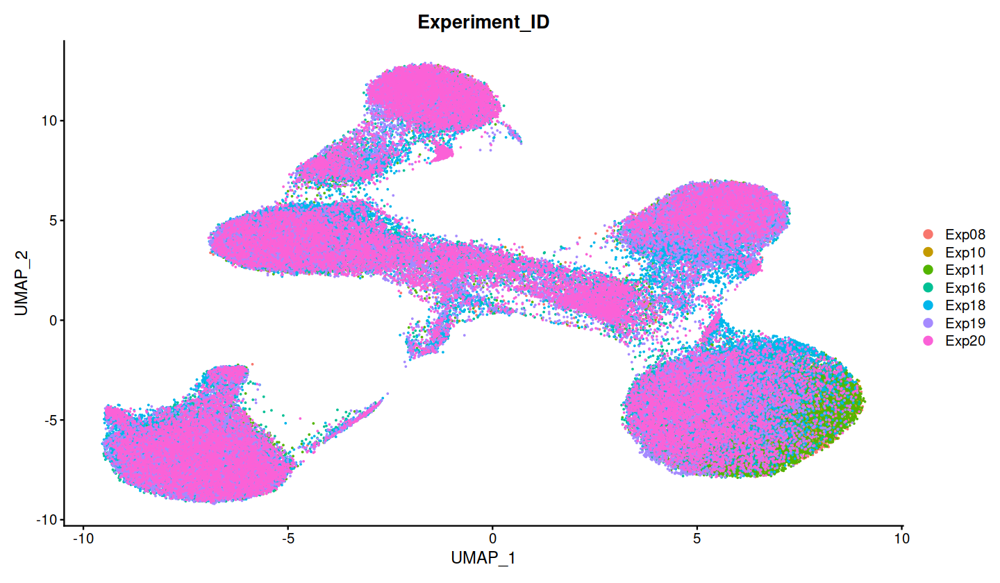

In [54]:
# Visualize
DimPlot(new_dia_experiment, group.by = c("Experiment_ID"), raster=F)

### PCA on samples

In [55]:
cd8_samples2  <- AverageExpression(new_dia_experiment, group.by = "Sample_char", return.seurat = T)

Warning message:
"Keys should be one or more alphanumeric characters followed by an underscore, setting key from prediction.score.celltype.l1_ to predictionscorecelltypel1_"
Warning message:
"Keys should be one or more alphanumeric characters followed by an underscore, setting key from prediction.score.celltype.l2_ to predictionscorecelltypel2_"
Warning message:
"Keys should be one or more alphanumeric characters followed by an underscore, setting key from prediction.score.celltype.l3_ to predictionscorecelltypel3_"
Centering and scaling data matrix



In [56]:
cd8_samples2  <- FindVariableFeatures(cd8_samples2)

In [57]:
cd8_samples2  <- RunPCA(cd8_samples2)

Warning message in irlba(A = t(x = object), nv = npcs, ...):
"You're computing too large a percentage of total singular values, use a standard svd instead."
PC_ 1 
Positive:  MYO1F, ADAM8, IQGAP1, ACTN4, PYHIN1, STOM, IQGAP2, KLRD1, SLAMF7, TBX21 
	   CST7, RAP1GAP2, SPN, NKG7, MSN, GK5, FGR, NFATC2, UTRN, FLNA 
	   TGFBR3, TLN1, SYNE2, SRGN, C1orf21, APMAP, MCTP2, PIK3AP1, S1PR5, SYNE1 
Negative:  LDHB, ACTN1, RGS10, TRABD2A, ARMH1, NELL2, LDLRAP1, A1BG, NPM1, CD248 
	   AIF1, BZW2, MAL, OXNAD1, DGKA, DNPH1, NT5E, LRRN3, LEF1, NAP1L1 
	   RCAN3, TCF7, BEX3, HSPB1, SERINC5, IL6R, SIRPG, IL6ST, FOXP1, NOG 
PC_ 2 
Positive:  SOCS3, MAP3K1, RTKN2, RELB, PPP2R5C, ANK1, ZNF683, ARID5B, TIAM1, TRGV10 
	   ATP2B1, PLCH2, HOOK2, FXYD1, EZR, ANXA5, C4orf48, GPR15, NPDC1, DUSP2 
	   IGHM, TNFAIP3, PI16, ELOVL5, MYADM, CLDND1, LYAR, NSD2, LMNA, FXYD2 
Negative:  CYBA, PCSK5, C1orf162, TRBC1, ARPC5, WDR1, CXCR2, CATSPER1, RASSF4, ABI3 
	   AKR1C3, ARPC2, NMUR1, CCDC28B, SIGLEC7, FCER1G, ADAMTS1, M

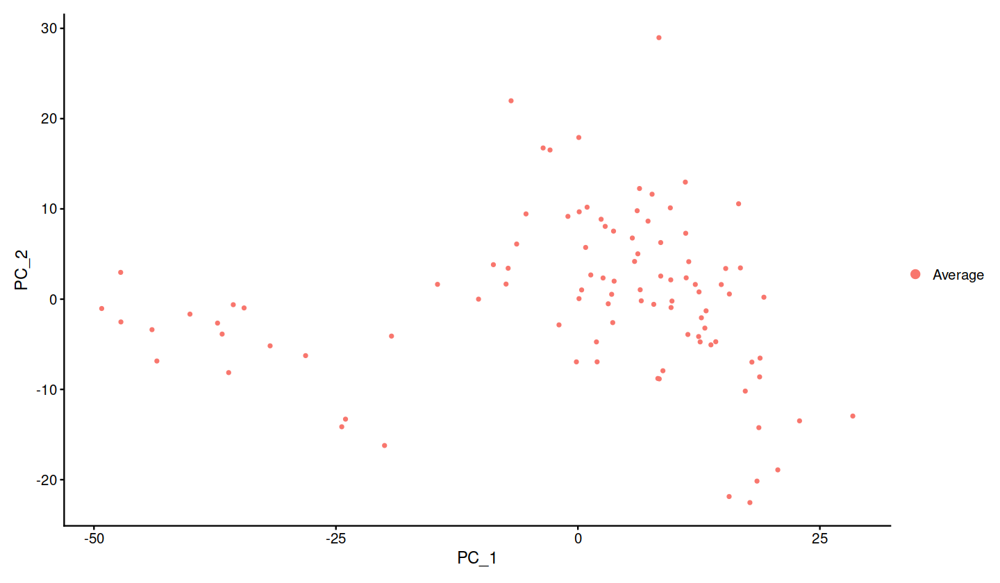

In [58]:
DimPlot(cd8_samples2)

In [59]:
cd8_samples2$Sample_char  <- colnames(cd8_samples2)

In [60]:
cd8_samples2@meta.data  <- cd8_samples2@meta.data  %>% separate(Sample_char, 
                                                              into = c("Patient_ID",
                                                                      "Disease",
                                                                      "Time",
                                                                      "Age_group",
                                                                      "Sex",
                                                                      "Exp"), 
                                                             sep = " ",
                                                             remove = F)

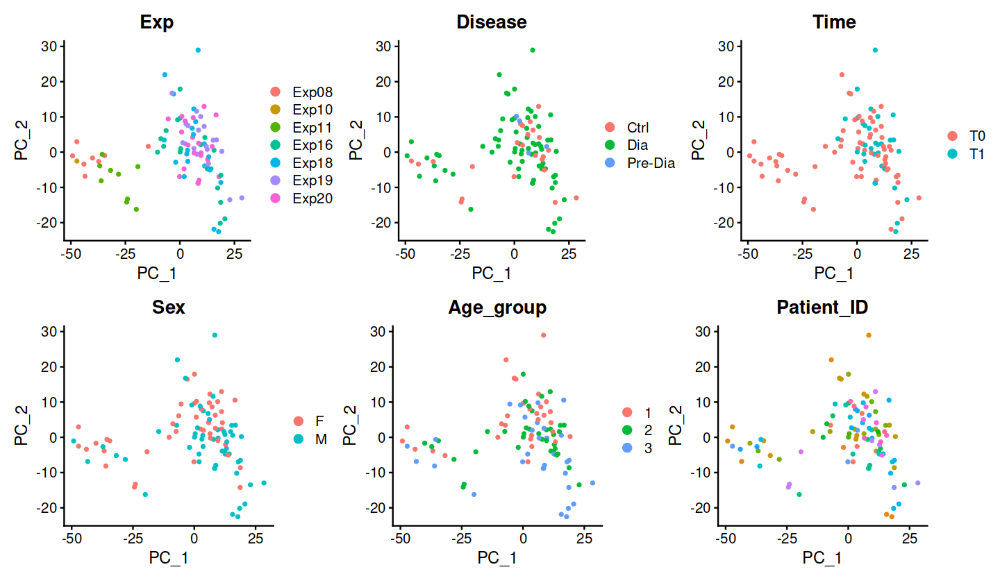

In [61]:
options(repr.plot.width = 12, repr.plot.height = 7)
(DimPlot(cd8_samples2, group.by = "Exp") + DimPlot(cd8_samples2, group.by = "Disease") + DimPlot(cd8_samples2, group.by = "Time")) / 
(DimPlot(cd8_samples2, group.by = "Sex") + DimPlot(cd8_samples2, group.by = "Age_group") + (DimPlot(cd8_samples2, group.by = "Patient_ID") + NoLegend()))

# Add metadata

In [62]:
md_dia  <- read_xlsx("data/dia_metadata.xlsx")

In [63]:
md_dia

id_pat,patient,rc,dat_nar,matched_dataset_manual,matched_group_manual,matched_dataset_propensity,matched_group_propensity,time_taken,age_taken,...,neutr_abs,eoz_abs,baz_abs,lymph_perc,mon_perc,neutr_perc,eoz_perc,baz_perc,tdd_1,tdd_per_kg_1
<dbl>,<dbl>,<chr>,<dttm>,<chr>,<dbl>,<chr>,<dbl>,<chr>,<dbl>,...,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
101,101,1812230552,2018-12-23,NA,NA,NA,NA,T0,2.138261,...,0.88,0.10,0.04,0.700,0.090,0.170,0.020,0.008,17.8,1.4833333
102,102,1711110951,2017-11-11,NA,NA,NA,NA,T0,3.252567,...,3.03,0.06,0.05,0.440,0.089,0.450,0.009,0.008,21.5,1.2356322
103,103,1304191240,2013-04-19,yes,33,NA,NA,T0,7.816564,...,1.47,0.15,0.04,0.560,0.079,0.314,0.032,0.009,27.5,1.3414634
104,104,0408165087,2004-08-16,NA,NA,yes,33,T0,16.547570,...,3.60,0.24,0.03,0.290,0.089,0.574,0.038,0.005,24.5,0.5000000
105,105,1706101309,2017-06-10,NA,NA,NA,NA,T0,3.731691,...,2.76,0.36,0.06,0.500,0.072,0.360,0.047,0.008,15.0,0.7692308
106,106,1959271281,2019-09-27,NA,NA,NA,NA,T0,1.434634,...,1.45,0.21,0.03,0.667,0.100,0.199,0.029,0.004,10.5,1.0937500
107,107,1610250708,2016-10-25,NA,NA,NA,NA,T0,4.355921,...,1.60,0.13,0.03,0.700,0.052,0.221,0.018,0.004,16.0,0.9638554
108,108,1355270697,2013-05-27,yes,32,NA,NA,T0,7.786448,...,0.51,0.10,0.02,0.720,0.080,0.160,0.030,0.006,24.0,0.8888889
109,109,1506260129,2015-06-26,NA,NA,NA,NA,T0,5.705681,...,1.70,0.09,0.03,0.510,0.090,0.370,0.020,0.007,45.0,2.2500000


In [64]:
md_seurat  <- new_dia_experiment@meta.data

In [65]:
md_seurat$Patient_Time  <- paste(md_seurat$Patient_ID, md_seurat$Time)

In [66]:
md_joined  <- left_join(md_seurat, md_dia)

Joining with `by = join_by(Patient_Time)`


In [67]:
new_dia_experiment@meta.data  <- md_joined
rownames(new_dia_experiment@meta.data)  <- colnames(new_dia_experiment)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



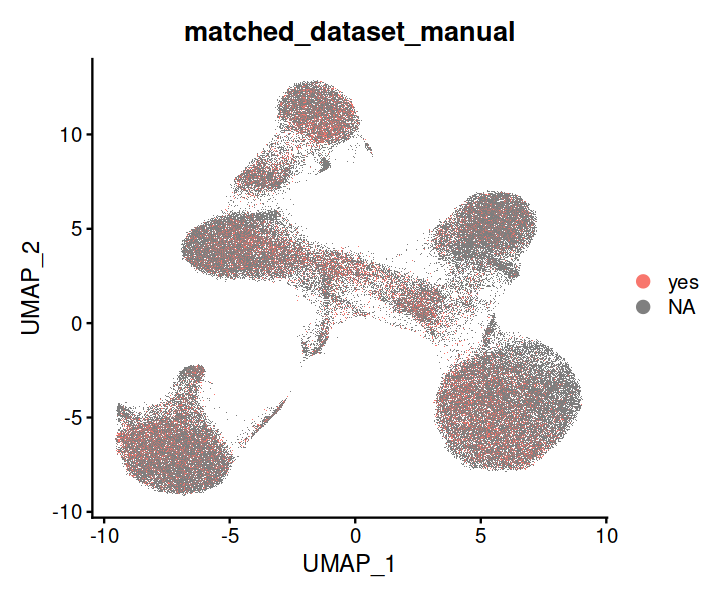

In [68]:
options(repr.plot.width = 6, repr.plot.height = 5)

DimPlot(new_dia_experiment, group.by = "matched_dataset_manual", raster = T)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



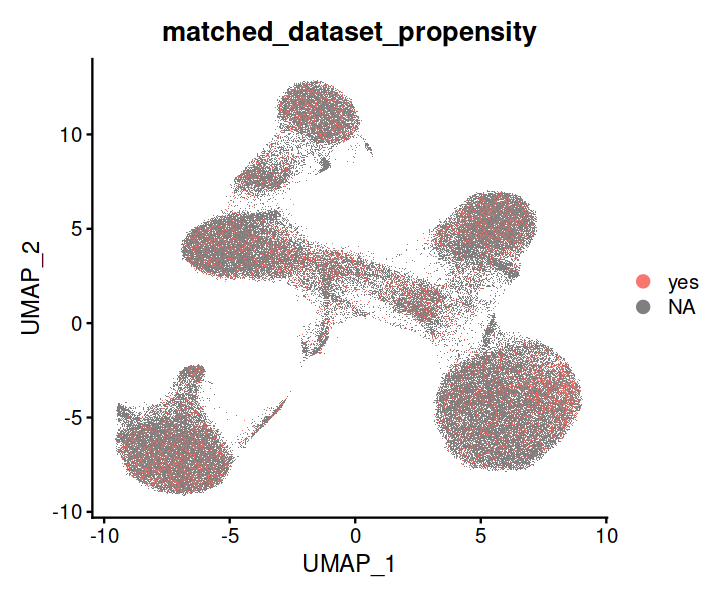

In [69]:
DimPlot(new_dia_experiment, group.by = "matched_dataset_propensity", raster = T)

In [70]:
saveRDS(new_dia_experiment, "data/processed/cd8_full_filt.rds")

# Analysis CD8 Level 1

In [71]:
new_dia_cd8 <- FindNeighbors(new_dia_experiment, dims = 1:12)

Computing nearest neighbor graph

Computing SNN



In [72]:
new_dia_cd8 <- FindClusters(new_dia_cd8, resolution = 0.6)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 105644
Number of edges: 2904635

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8986
Number of communities: 16
Elapsed time: 44 seconds


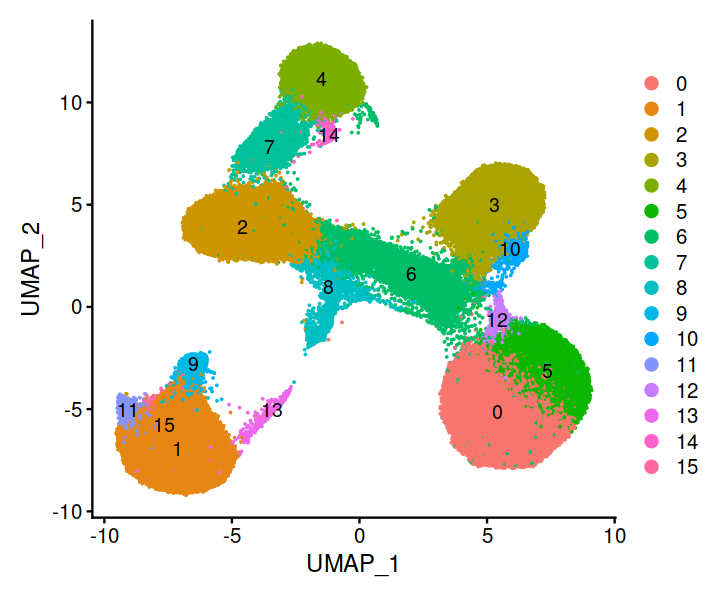

In [73]:
options(repr.plot.width=6, repr.plot.height=5)

DimPlot(new_dia_cd8, label = T, raster = F)

In [74]:
new_dia_cd8@meta.data  <- new_dia_cd8@meta.data  %>% 
mutate(annotations_l1 = recode_factor(seurat_clusters, 
                                     "0" = "CD8 T cells",
                                     "1" = "NK cells",
                                     "2" = "CD8 T cells",
                                     "3" = "CD8 T cells",
                                     "4" = "Unconventional T cells",
                                     "5" = "CD8 T cells",
                                     "6" = "CD8 T cells",
                                     "7" = "Unconventional T cells",
                                     "8" = "CD8 T cells",
                                     "9" = "NK cells",
                                     "10" = "CD8 T cells",
                                     "11" = "NK cells",
                                     "12" = "CD8 T cells",
                                     "13" = "NK cells",
                                     "14" = "Unconventional T cells",
                                     "15" = "NK cells"
                                     ))

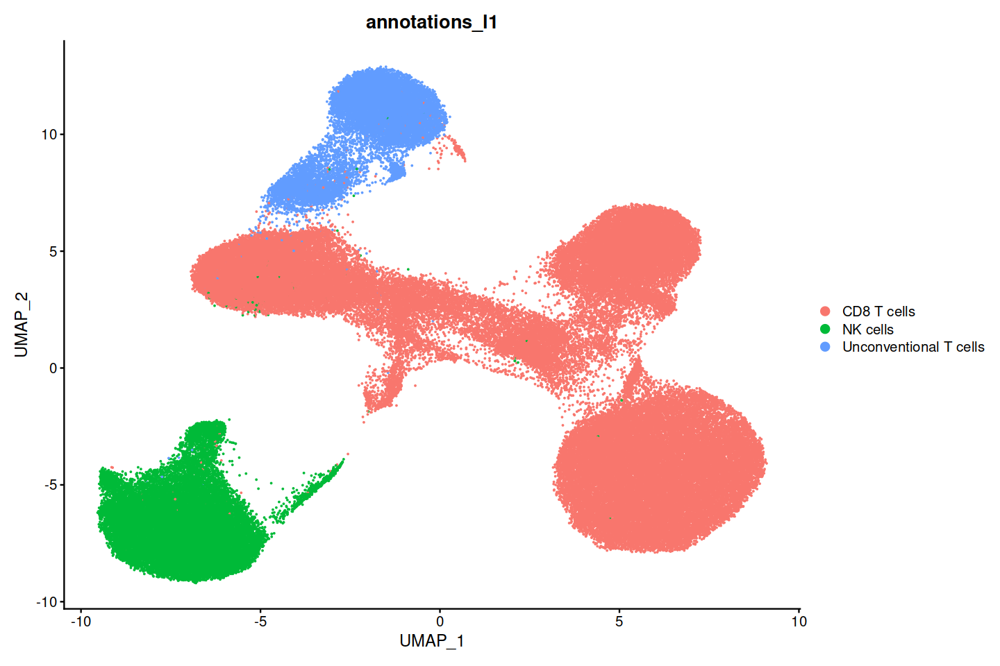

In [77]:
options(repr.plot.width = 12, repr.plot.height = 8)

DimPlot(new_dia_cd8, group.by = "annotations_l1", raster = F)

In [76]:
saveRDS(new_dia_cd8, "data/processed/cd8_full_filt.rds")

# Analysis CD8 Level 2

## Analysis CD8 Level 2: Conventional CD8+ T cells

In [78]:
merged.list  <- SplitObject(subset(new_dia_cd8, annotations_l1 == "CD8 T cells"), split.by = "Experiment_ID")

In [79]:
merged.list <- lapply(X = merged.list, FUN = function(x) {
    DefaultAssay(x)  <- "RNA"
    x$barcode  <- colnames(x)
    x <- NormalizeData(x)
    x <- FindVariableFeatures(x, selection.method = "vst", nfeatures = 2000)
})

In [80]:
new_dia_experiment2 <- Run.STACAS(merged.list, dims = 1:12)
new_dia_experiment2 <- RunUMAP(new_dia_experiment2, dims = 1:12) 

Warning message in asMethod(object):
"sparse->dense coercion: allocating vector of size 1.3 GiB"
Warning message in asMethod(object):
"sparse->dense coercion: allocating vector of size 1.1 GiB"
Preparing PCA embeddings for objects...

Building integration tree with base dataset: 7

Merging dataset 6 into 7

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 5 into 7 6

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 4 into 7 6 5

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 3 into 1

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 1 3 into 7 6 5 4

Extracting anchors for merged samples

Finding integration vectors

Finding integrati

In [81]:
cd8_subcluster  <- new_dia_experiment2

In [82]:
cd8_subcluster <- FindNeighbors(cd8_subcluster, reduction = "pca", dims = 1:12)

Computing nearest neighbor graph

Computing SNN



In [83]:
cd8_subcluster <- FindClusters(cd8_subcluster, resolution = 0.6)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 70277
Number of edges: 1894161

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8654
Number of communities: 13
Elapsed time: 26 seconds


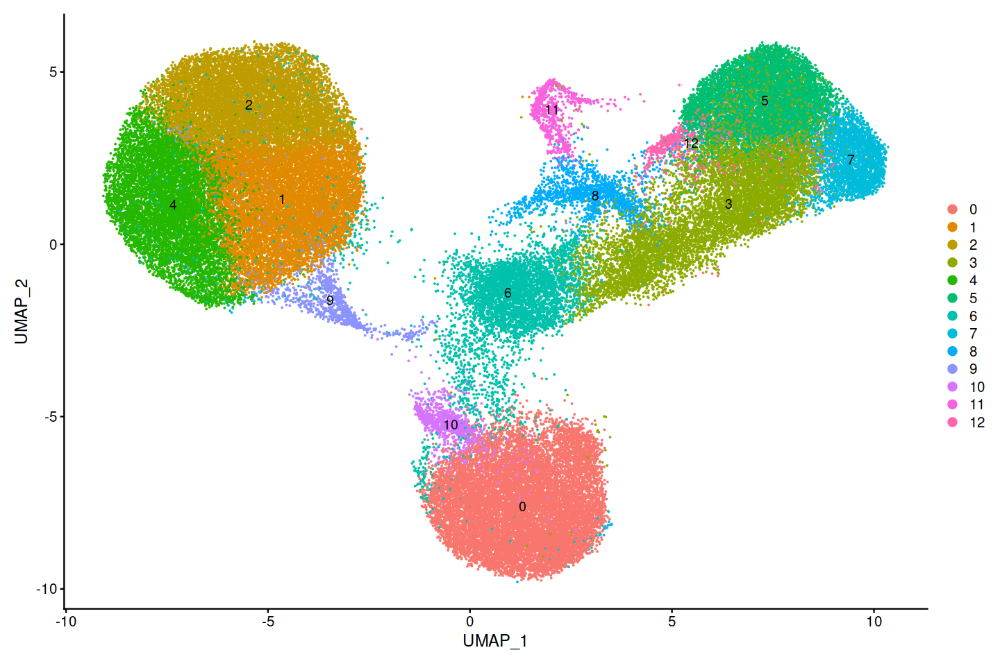

In [85]:
DimPlot(cd8_subcluster, label = T)

In [96]:
cd8_subcluster@meta.data  <- cd8_subcluster@meta.data  %>% 
mutate(annotations_l2 = recode_factor(seurat_clusters, 
                                      "0" = "Tem",
                                     "1" = "Naive",
                                     "2" = "Naive",
                                     "3" = "Tcm 2",
                                     "4" = "Naive",
                                     "5" = "Temra 1",
                                     "6" = "Tcm 1",
                                     "7" = "Temra 2",
                                     "8" = "Proliferating",
                                     "9" = "Tem ISAGhi",
                                     "10" = "Naive ISAGhi",
                                     "11" = "Proliferating",
                                     "12" = "Temra ISAGhi"                                     
                                     ))

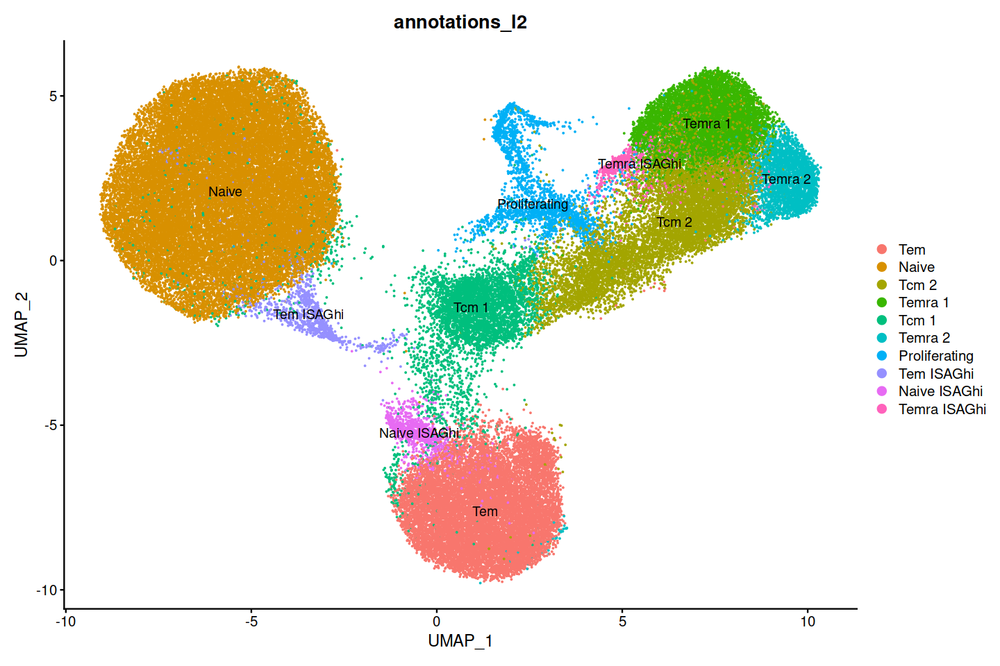

In [97]:
DimPlot(cd8_subcluster, label = T, group.by = "annotations_l2")

`summarise()` has grouped output by 'Sample_ID'. You can override using the
`.groups` argument.
Joining with `by = join_by(Sample_ID)`
Warning message in geom_jitter(binaxis = "y", position = position_jitter(width = 0.1, :
"Ignoring unknown parameters: `binaxis` and `stackdir`"
Bin width defaults to 1/30 of the range of the data. Pick better value with
`binwidth`.


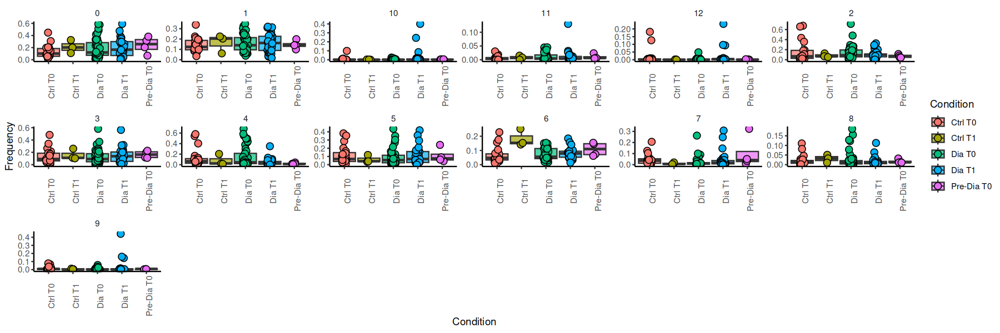

In [112]:
options(repr.plot.width = 15, repr.plot.height = 5)

seurat_meta_data <- cd8_subcluster@meta.data

# Create grouped dataframe, calculate the frequencies of clusters
df4 <- seurat_meta_data %>% 
  group_by(Sample_ID, seurat_clusters) %>% 
  summarise(n = n()) %>% 
  unique() %>% 
  mutate(freq = n / sum(n))  %>% 
dplyr::select(-n)  %>% 
ungroup   %>% 
pivot_wider(names_from = "seurat_clusters", values_from = "freq", values_fill = 0)   %>% 
pivot_longer(!Sample_ID, values_to = "freq", names_to = "seurat_clusters")
# Control - all sums should be one
# df4 %>% group_by(Sample_ID) %>% summarise(sum = sum(freq))

# As we've lost non-grouping variables, let's join them back
md_to_join <- seurat_meta_data %>% 
  dplyr::select(Sample_ID, Condition, Disease, Sex, Age, Age_group, Patient_ID, Time, Experiment_ID) %>% 
  unique()

df4  <- left_join(df4, md_to_join)

# The final plot

df4 %>% 
  ggplot(aes(x = Condition, y = freq)) + # you can change the x to whatever variable you're interested in
  geom_boxplot(outlier.shape = NA, 
           alpha = 0.7, width = 0.9, aes(fill = Condition)) +
   geom_dotplot(binaxis='y', stackdir='center', dotsize=0) + 
   geom_jitter(binaxis='y', position=position_jitter(width = 0.1, height = 0), 
  size = 3, shape = 21, stackdir='center', aes(fill = Condition), color = "black") + 
  facet_wrap(~seurat_clusters, scales = "free", ncol = 6) +
  ylab("Frequency") +
  xlab("Condition") +
  theme_classic() +
 ylim(0,NA) +
  theme(strip.background = element_blank(), panel.grid = element_blank()) + 
  theme(axis.text.x = element_text(angle = 90))

Warning message in geom_jitter(binaxis = "y", position = position_jitter(width = 0.2, :
"Ignoring unknown parameters: `binaxis` and `stackdir`"
Bin width defaults to 1/30 of the range of the data. Pick better value with
`binwidth`.


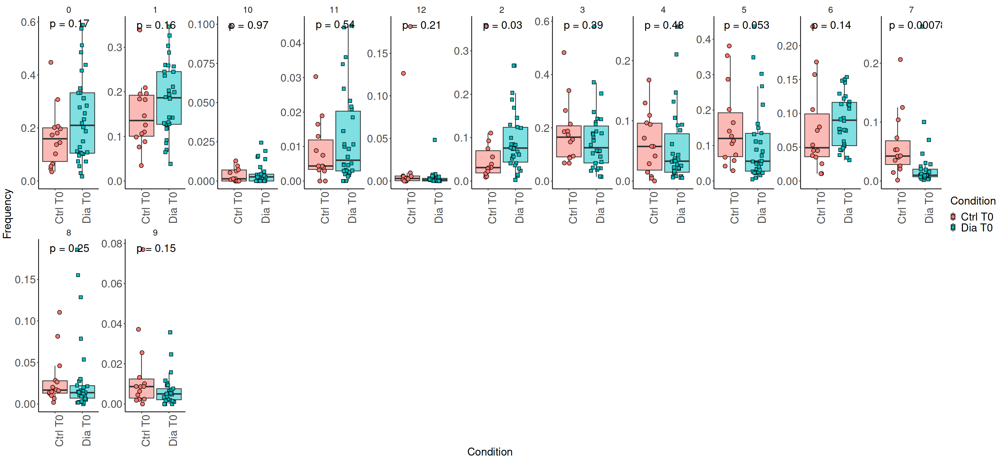

In [113]:
options(repr.plot.width = 26, repr.plot.height = 12)

df4 %>% 
filter(Condition %in% c("Ctrl T0", "Dia T0") & Experiment_ID %in% c("Exp16", "Exp18", "Exp19", "Exp20"))  %>% 
  ggplot(aes(x = Condition, y = freq)) + # you can change the x to whatever variable you're interested in
  geom_boxplot(outlier.shape = NA, 
           alpha = 0.5, width = 0.9, aes(fill = Condition)) +
   geom_dotplot(binaxis='y', stackdir='center', dotsize=0) + 
   geom_jitter(binaxis='y', position=position_jitter(width = 0.2, height = 0), 
  size = 3, stackdir='center', aes(fill = Condition, shape = Condition), color = "black") + 
  facet_wrap(~seurat_clusters, scales = "free", ncol = 11) +
scale_shape_manual(values = c(21,22))+
  ylab("Frequency") +
  xlab("Condition") +
  theme_classic() +
ggtheme() +
ggpubr::stat_compare_means(label.x= 1.1, label.y.npc = 1, size = 7.025, vjust = 0.3, label = "p.format")+
 ylim(0,NA) +
  theme(strip.background = element_blank(), panel.grid = element_blank()) + 
  theme(axis.text.x = element_text(angle = 90))

In [114]:
df4  <- df4  %>% 
mutate(annotations_l2 = recode_factor(seurat_clusters, 
                                      "0" = "Tem",
                                     "1" = "Naive",
                                     "2" = "Naive",
                                     "3" = "Tcm 2",
                                     "4" = "Naive",
                                     "5" = "Temra 1",
                                     "6" = "Tcm 1",
                                     "7" = "Temra 2",
                                     "8" = "Proliferating",
                                     "9" = "Tem ISAGhi",
                                     "10" = "Naive ISAGhi",
                                     "11" = "Proliferating",
                                     "12" = "Temra ISAGhi"                                     
                                     ))

Warning message in geom_jitter(binaxis = "y", position = position_jitter(width = 0.2, :
"Ignoring unknown parameters: `binaxis` and `stackdir`"
Scale for y is already present.
Adding another scale for y, which will replace the existing scale.
Bin width defaults to 1/30 of the range of the data. Pick better value with
`binwidth`.


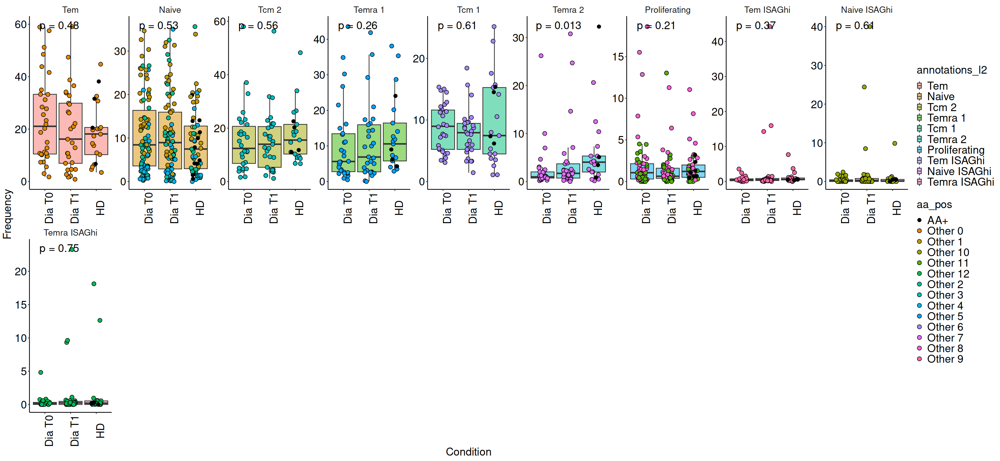

In [115]:
df4 %>%
filter(Experiment_ID %in% c("Exp16", "Exp18", "Exp19", "Exp20"))  %>% 
mutate(Condition2 = if_else(Disease %in% c("Ctrl", "Pre-Dia"), "HD", Condition))  %>% 
 mutate(aa_pos = if_else(Disease %in% c("Pre-Dia"), "AA+", paste("Other", seurat_clusters)))  %>% 
  ggplot(aes(x = Condition2, y = freq*100)) + # you can change the x to whatever variable you're interested in
  geom_boxplot(outlier.shape = NA, 
           alpha = 0.5, width = 0.9, aes(fill = annotations_l2)) +
  new_scale_fill() +
  geom_dotplot(binaxis='y', stackdir='center', dotsize=0) + 
  geom_jitter(binaxis='y', position=position_jitter(width = 0.2, height = 0), 
  size = 3, stackdir='center', aes(fill = aa_pos, shape = aa_pos), color = "black") +
  
  facet_wrap(~annotations_l2, scales = "free", ncol = 9) +
  ylab("Frequency") +
scale_shape_manual(values = c(16,21,21,21,21,21,21,21,21,21,21,21,21,21))+
  xlab("Condition") +
  theme_classic() +
ggtheme() +
ggpubr::stat_compare_means(label.x= 1.1, label.y.npc = 1, size = 7.025, vjust = 0.3, label = "p.format")+
 ylim(0,NA) +
  theme(strip.background = element_blank(), panel.grid = element_blank()) + 
  theme(axis.text = element_text(color = "black"),
        axis.line = element_line(color = "black"),
        axis.text.x = element_text(angle = 90))

Warning message in geom_jitter(binaxis = "y", position = position_jitter(width = 0.2, :
"Ignoring unknown parameters: `binaxis` and `stackdir`"
Scale for y is already present.
Adding another scale for y, which will replace the existing scale.
Bin width defaults to 1/30 of the range of the data. Pick better value with
`binwidth`.


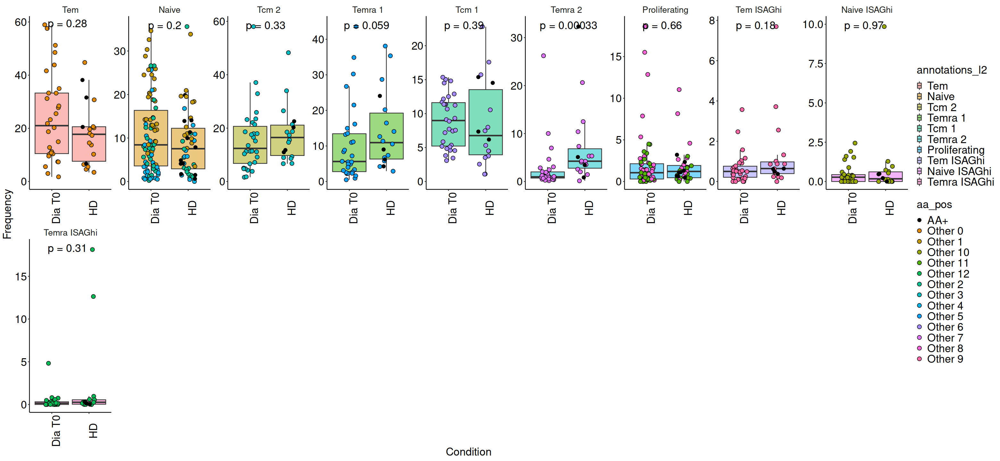

In [116]:
df4 %>%
filter(Experiment_ID %in% c("Exp16", "Exp18", "Exp19", "Exp20") & Time == "T0")  %>% 
mutate(Condition2 = if_else(Disease %in% c("Ctrl", "Pre-Dia"), "HD", Condition))  %>% 
 mutate(aa_pos = if_else(Disease %in% c("Pre-Dia"), "AA+", paste("Other", seurat_clusters)))  %>% 
  ggplot(aes(x = Condition2, y = freq*100)) + # you can change the x to whatever variable you're interested in
  geom_boxplot(outlier.shape = NA, 
           alpha = 0.5, width = 0.9, aes(fill = annotations_l2)) +
  new_scale_fill() +
  geom_dotplot(binaxis='y', stackdir='center', dotsize=0) + 
  geom_jitter(binaxis='y', position=position_jitter(width = 0.2, height = 0), 
  size = 3, stackdir='center', aes(fill = aa_pos, shape = aa_pos), color = "black") +
  
  facet_wrap(~annotations_l2, scales = "free", ncol = 9) +
  ylab("Frequency") +
scale_shape_manual(values = c(16,21,21,21,21,21,21,21,21,21,21,21,21,21))+
  xlab("Condition") +
  theme_classic() +
ggtheme() +
ggpubr::stat_compare_means(label.x= 1.1, label.y.npc = 1, size = 7.025, vjust = 0.3, label = "p.format")+
 ylim(0,NA) +
  theme(strip.background = element_blank(), panel.grid = element_blank()) + 
  theme(axis.text = element_text(color = "black"),
        axis.line = element_line(color = "black"),
        axis.text.x = element_text(angle = 90))

In [ ]:
saveRDS(cd8_subcluster, "data/processed/cd8_subcluster.rds")

In [ ]:
cd8_subcluster  <- readRDS("data/processed/cd8_subcluster.rds")

In [ ]:
plan("multisession")

In [ ]:
mrk  <- FindAllMarkers(cd8_subcluster, logfc.threshold = log(1.5))

In [ ]:
write.csv(mrk, "markers_cd8_full.csv")

### Cluster tree

In [ ]:
DimPlot(cd8_subcluster, label = T)

In [ ]:
cd8_subcluster <- BuildClusterTree(
  cd8_subcluster,
  dims = 1:12,
  reorder = FALSE,
  reorder.numeric = FALSE
)

In [ ]:
tree <- cd8_subcluster@tools$BuildClusterTree
tree$tip.label <- paste0("Cluster ", tree$tip.label)

In [ ]:
p <- ggtree::ggtree(tree, aes(x, y)) +
  scale_y_reverse() +
  ggtree::geom_tree() +
  ggtree::theme_tree() +
  ggtree::geom_tiplab(offset = 1) +
  ggtree::geom_tippoint(color = (scales::hue_pal() (15)), shape = 16, size = 5) +
  coord_cartesian(clip = 'off') +
  theme(plot.margin = unit(c(0,2.5,0,0), 'cm'))

#ggsave('plots/cluster_tree.png', p, height = 4, width = 6)

In [ ]:
options(repr.plot.width=3.5, repr.plot.height=3)
p

## Analysis CD8 Level 2: NK cells

In [ ]:
merged.list  <- SplitObject(subset(new_dia_cd8, annotations_l1 == "NK cells"), split.by = "Experiment_ID")

In [ ]:
merged.list <- lapply(X = merged.list, FUN = function(x) {
    DefaultAssay(x)  <- "RNA"
    x$barcode  <- colnames(x)
    x <- NormalizeData(x)
    x <- FindVariableFeatures(x, selection.method = "vst", nfeatures = 800)
})

In [ ]:
new_dia_experiment2 <- Run.STACAS(merged.list, dims = 1:12)
new_dia_experiment2 <- RunUMAP(new_dia_experiment2, dims = 1:12) 

In [ ]:
nk_subcluster  <- new_dia_experiment2

In [ ]:
nk_subcluster <- FindNeighbors(nk_subcluster, reduction = "pca", dims = 1:12)

In [ ]:
nk_subcluster <- FindClusters(nk_subcluster, resolution = 0.6)

In [ ]:
DimPlot(nk_subcluster)

In [ ]:
saveRDS(nk_subcluster, "data/processed/nk_subcluster.rds")

## Analysis CD8 Level 2: Unconventional cells

# Analysis CD8 Level 3

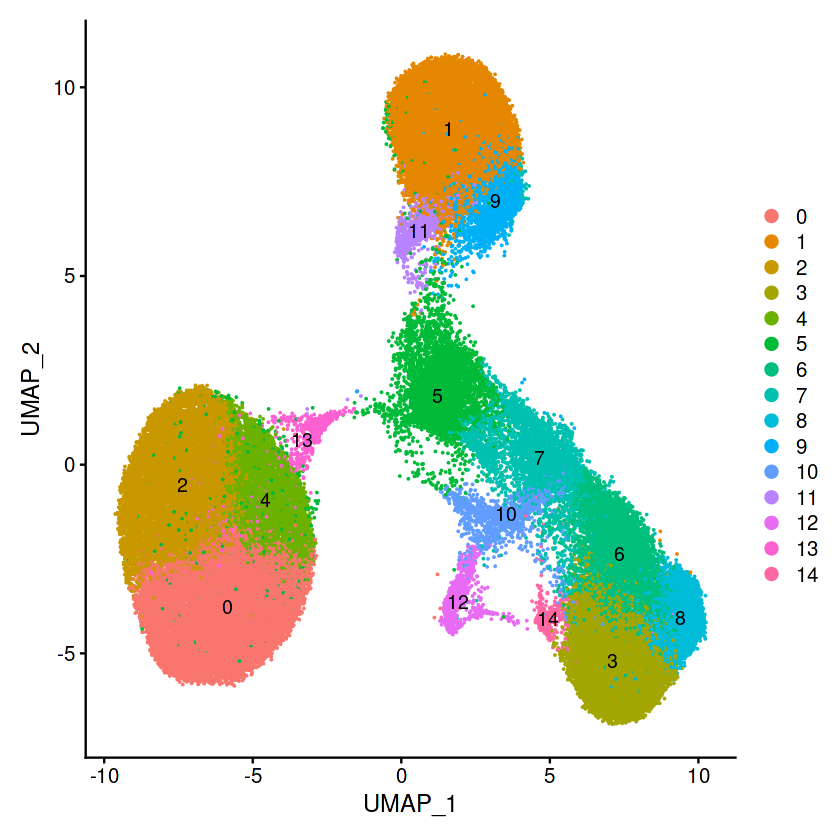

In [18]:
DimPlot(cd8_subcluster, label = T)

## Analysis CD8 Level 3: Teff

In [19]:
teff <- subset(cd8_subcluster, seurat_clusters %in% c(3,5,6,7,8,10,12,14))

In [20]:
teff

An object of class Seurat 
16142 features across 27197 samples within 4 assays 
Active assay: integrated (976 features, 976 variable features)
 3 other assays present: RNA, Antibodies, PTPRC
 2 dimensional reductions calculated: pca, umap

In [21]:
teff_dia_experiment  <- SplitObject(teff, split.by = "Experiment_ID")

In [22]:
teff_dia_experiment

$Exp08
An object of class Seurat 
16142 features across 1053 samples within 4 assays 
Active assay: integrated (976 features, 976 variable features)
 3 other assays present: RNA, Antibodies, PTPRC
 2 dimensional reductions calculated: pca, umap

$Exp10
An object of class Seurat 
16142 features across 80 samples within 4 assays 
Active assay: integrated (976 features, 976 variable features)
 3 other assays present: RNA, Antibodies, PTPRC
 2 dimensional reductions calculated: pca, umap

$Exp11
An object of class Seurat 
16142 features across 1276 samples within 4 assays 
Active assay: integrated (976 features, 976 variable features)
 3 other assays present: RNA, Antibodies, PTPRC
 2 dimensional reductions calculated: pca, umap

$Exp16
An object of class Seurat 
16142 features across 3979 samples within 4 assays 
Active assay: integrated (976 features, 976 variable features)
 3 other assays present: RNA, Antibodies, PTPRC
 2 dimensional reductions calculated: pca, umap

$Exp18
An object o

In [23]:
plan("sequential")

In [24]:
# normalize and identify variable features for each dataset independently
merged.list <- lapply(X = teff_dia_experiment, FUN = function(x) {
    DefaultAssay(x)  <- "RNA"
    x$barcode  <- colnames(x)
    x <- NormalizeData(x)
    x <- FindVariableFeatures(x, selection.method = "vst", nfeatures = 500)
})

library(STACAS)

teff_dia_experiment <- Run.STACAS(merged.list, dims = 1:10)
teff_dia_experiment <- RunUMAP(teff_dia_experiment, dims = 1:10) 

Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“pseudoinverse used at -1.9218”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“neighborhood radius 0.49582”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“reciprocal condition number  2.8365e-16”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“There are other near singularities as well. 0.090619”
Excluding 1 datasets with < 100 cells

You may alter this behavior by setting the min.sample.size parameter

Preparing PCA embeddings for objects...

Building integration tree with base dataset: 5

Merging dataset 3 into 6

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 6 3 into 5

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Int

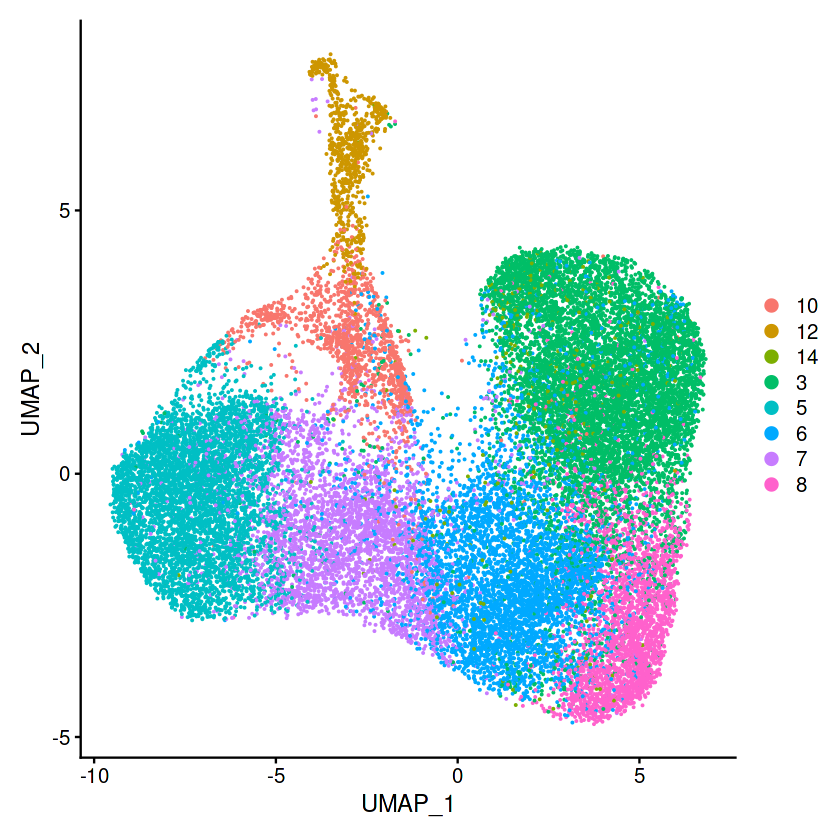

In [25]:
# Visualize

DimPlot(teff_dia_experiment)

In [26]:
teff_dia_experiment  <- FindNeighbors(teff_dia_experiment)
teff_dia_experiment  <- FindClusters(teff_dia_experiment, resolution = 0.5)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 27117
Number of edges: 769714

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8490
Number of communities: 8
Elapsed time: 7 seconds


In [32]:
saveRDS(teff_dia_experiment, "data/processed/cd8_subcluster_teff.rds")